In [1]:
import tensorflow as tf
print(tf.__version__)

2.4.1


In [3]:
!pip install -q tensorflow-datasets
import tensorflow_datasets as tfds
imdb, info = tfds.load("imdb_reviews", with_info=True, as_supervised=True)

In [4]:
import numpy as np

train_data, test_data = imdb['train'], imdb['test']

In [9]:
len(train_data) , len(test_data)

(25000, 25000)

In [12]:
#train_examples, train_labels = tfds.as_numpy(train_data)
#test_examples, test_labels = tfds.as_numpy(test_data)
import numpy as np

train_data, test_data = imdb['train'], imdb['test']

training_sentences = []
training_labels = []

testing_sentences = []
testing_labels = []

# str(s.tonumpy()) is needed in Python3 instead of just s.numpy()
for s,l in train_data:
  training_sentences.append(str(s.numpy()))
  training_labels.append(l.numpy())
  
for s,l in test_data:
  testing_sentences.append(str(s.numpy()))
  testing_labels.append(l.numpy())
  
training_labels_final = np.array(training_labels)
testing_labels_final = np.array(testing_labels)

In [13]:
vocab_size = 10000
embedding_dim = 16
max_length = 120
trunc_type='post'
oov_tok = "<OOV>"


from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences

tokenizer = Tokenizer(num_words = vocab_size, oov_token=oov_tok)
tokenizer.fit_on_texts(training_sentences)
word_index = tokenizer.word_index
sequences = tokenizer.texts_to_sequences(training_sentences)
padded = pad_sequences(sequences,maxlen=max_length, truncating=trunc_type)

testing_sequences = tokenizer.texts_to_sequences(testing_sentences)
testing_padded = pad_sequences(testing_sequences,maxlen=max_length)

In [14]:
reverse_word_index = dict([(value, key) for (key, value) in word_index.items()])

def decode_review(text):
    return ' '.join([reverse_word_index.get(i, '?') for i in text])

print(decode_review(padded[1]))
print(training_sentences[1])

? ? ? ? ? ? ? b'i have been known to fall asleep during films but this is usually due to a combination of things including really tired being warm and comfortable on the <OOV> and having just eaten a lot however on this occasion i fell asleep because the film was rubbish the plot development was constant constantly slow and boring things seemed to happen but with no explanation of what was causing them or why i admit i may have missed part of the film but i watched the majority of it and everything just seemed to happen of its own <OOV> without any real concern for anything else i cant recommend this film at all '
b'I have been known to fall asleep during films, but this is usually due to a combination of things including, really tired, being warm and comfortable on the sette and having just eaten a lot. However on this occasion I fell asleep because the film was rubbish. The plot development was constant. Constantly slow and boring. Things seemed to happen, but with no explanation of 

In [15]:
model = tf.keras.Sequential([
    tf.keras.layers.Embedding(vocab_size, embedding_dim, input_length=max_length),
    tf.keras.layers.Bidirectional(tf.keras.layers.GRU(32)),
    tf.keras.layers.Dense(6, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')
])
model.compile(loss='binary_crossentropy',optimizer='adam',metrics=['accuracy'])
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding (Embedding)        (None, 120, 16)           160000    
_________________________________________________________________
bidirectional (Bidirectional (None, 64)                9600      
_________________________________________________________________
dense (Dense)                (None, 6)                 390       
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 7         
Total params: 169,997
Trainable params: 169,997
Non-trainable params: 0
_________________________________________________________________


In [16]:
num_epochs = 5
history = model.fit(padded, training_labels_final, epochs=num_epochs, validation_data=(testing_padded, testing_labels_final))

Epoch 1/5
782/782 [==============================] - 87s 100ms/step - loss: 0.6730 - accuracy: 0.5610 - val_loss: 0.4767 - val_accuracy: 0.7921
Epoch 2/5
782/782 [==============================] - 76s 97ms/step - loss: 0.3985 - accuracy: 0.8341 - val_loss: 0.3619 - val_accuracy: 0.8401
Epoch 3/5
782/782 [==============================] - 79s 101ms/step - loss: 0.2765 - accuracy: 0.8940 - val_loss: 0.3942 - val_accuracy: 0.8443
Epoch 4/5
782/782 [==============================] - 89s 114ms/step - loss: 0.2151 - accuracy: 0.9222 - val_loss: 0.4276 - val_accuracy: 0.8387
Epoch 5/5
782/782 [==============================] - 80s 103ms/step - loss: 0.1714 - accuracy: 0.9419 - val_loss: 0.4473 - val_accuracy: 0.8266


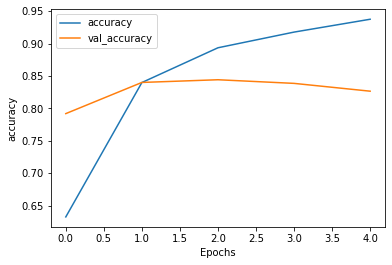

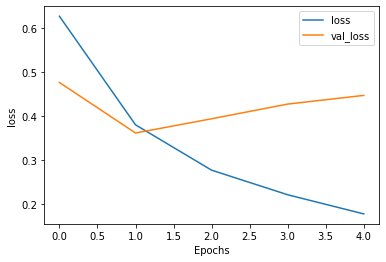

In [17]:
import matplotlib.pyplot as plt


def plot_graphs(history, string):
  plt.plot(history.history[string])
  plt.plot(history.history['val_'+string])
  plt.xlabel("Epochs")
  plt.ylabel(string)
  plt.legend([string, 'val_'+string])
  plt.show()

plot_graphs(history, 'accuracy')
plot_graphs(history, 'loss')

In [18]:
# Model Definition with LSTM
model = tf.keras.Sequential([
    tf.keras.layers.Embedding(vocab_size, embedding_dim, input_length=max_length),
    tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(32)),
    tf.keras.layers.Dense(6, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')
])
model.compile(loss='binary_crossentropy',optimizer='adam',metrics=['accuracy'])
model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_1 (Embedding)      (None, 120, 16)           160000    
_________________________________________________________________
bidirectional_1 (Bidirection (None, 64)                12544     
_________________________________________________________________
dense_2 (Dense)              (None, 6)                 390       
_________________________________________________________________
dense_3 (Dense)              (None, 1)                 7         
Total params: 172,941
Trainable params: 172,941
Non-trainable params: 0
_________________________________________________________________


In [19]:
# Model Definition with Conv1D
model = tf.keras.Sequential([
    tf.keras.layers.Embedding(vocab_size, embedding_dim, input_length=max_length),
    tf.keras.layers.Conv1D(128, 5, activation='relu'),
    tf.keras.layers.GlobalAveragePooling1D(),
    tf.keras.layers.Dense(6, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')
])
model.compile(loss='binary_crossentropy',optimizer='adam',metrics=['accuracy'])
model.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_2 (Embedding)      (None, 120, 16)           160000    
_________________________________________________________________
conv1d (Conv1D)              (None, 116, 128)          10368     
_________________________________________________________________
global_average_pooling1d (Gl (None, 128)               0         
_________________________________________________________________
dense_4 (Dense)              (None, 6)                 774       
_________________________________________________________________
dense_5 (Dense)              (None, 1)                 7         
Total params: 171,149
Trainable params: 171,149
Non-trainable params: 0
_________________________________________________________________


In [20]:
for i in train_data:
    print(i)

(<tf.Tensor: shape=(), dtype=string, numpy=b"This was an absolutely terrible movie. Don't be lured in by Christopher Walken or Michael Ironside. Both are great actors, but this must simply be their worst role in history. Even their great acting could not redeem this movie's ridiculous storyline. This movie is an early nineties US propaganda piece. The most pathetic scenes were those when the Columbian rebels were making their cases for revolutions. Maria Conchita Alonso appeared phony, and her pseudo-love affair with Walken was nothing but a pathetic emotional plug in a movie that was devoid of any real meaning. I am disappointed that there are movies like this, ruining actor's like Christopher Walken's good name. I could barely sit through it.">, <tf.Tensor: shape=(), dtype=int64, numpy=0>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'I have been known to fall asleep during films, but this is usually due to a combination of things including, really tired, being warm and comfortable on

(<tf.Tensor: shape=(), dtype=string, numpy=b"Brian Yuzna is often frowned upon as a director for his trashy gore-fests, but the truth is that his films actually aren't bad at all. The Re-Animator sequels aren't as great as the original, but are still worthy as far as horror sequels are concerned. Return of the Living Dead 3 is the best of the series; and Society isn't a world away from being a surrealist horror masterpiece. This thriller certainly isn't a masterpiece; but it shows Yuzna's eye for horror excellently, and the plot moves in a way that is always thrilling and engaging. I'm really surprised that a horror movie about dentistry didn't turn up until 1996, as going to the dentist is almost a primal fear - it's running away from a tiger for the modern world. Dentistry doesn't frighten me, but surprisingly; I would appear to be in the minority. The plot follows perfectionist dentist Dr Feinstone. He has a nice house, a successful career and a beautiful wife - pretty much everythi

(<tf.Tensor: shape=(), dtype=string, numpy=b'Rosalind Russell executes a power-house performance as Rosie Lord, a very wealthy woman with greedy heirs. With an Auntie Mame-type character, this actress can never go wrong. Her very-real terror at being in an insane assylum is a wonderful piece of acting. Everyone should watch this.'>, <tf.Tensor: shape=(), dtype=int64, numpy=1>)
(<tf.Tensor: shape=(), dtype=string, numpy=b"The acting is pretty cheesy, but for the people in this area up in the 80s and are now Detroit area automotive engineers, this is a great movie. I even work with a Japanese supplier so that makes this movie even more funny.<br /><br />Jay Leno was showing his age last night on The Tonight Show! He looks pretty young here...17 years ago. The opening scene, with the drag race on what appears to be Woodward Ave was great.<br /><br />Leno also owns some bad a** cars now, it would e great to see a remake of this with his modern collection. I'm sure the blown Vette in the op

(<tf.Tensor: shape=(), dtype=string, numpy=b'I LOVED the Apprentice for the first two seasons.<br /><br />But now with season 5? (or is it 6?) things are getting just plain too tiring.<br /><br />I used to like the show, but its become Donald Trumps own ego fest. Granted its his company you\'ll be working for, but come on! some of the things says "You\'re FIRED" is just insulting.<br /><br />after watching the show, I would not want to work for him. not because he is arrogant, pompous or such. Its just that the show is unrealistic and the way he handles things makes me just squirm. Good Entertainment? YES, but tiring as the back stabbing gets so tiring.. its not team work, its not personal, its just business. watch your back jack.'>, <tf.Tensor: shape=(), dtype=int64, numpy=0>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'For those who commented on The Patriot as being accurate, (Which basically satanised the English), it was interesting to see this film. By all accounts this was the b

(<tf.Tensor: shape=(), dtype=string, numpy=b'This was a delightful presentation. Hemo (blood) as a Greek god was so well played by the animation with vanity, arrogance, snobbish superiority and innocent wonder. The quote (or scene) I recall vividly is when Hemo tires of "all this plumbing ... you haven\'t learned my secrets at all" and threatens to storm out, the Scientist answers him in a single word "Thalassa" -- salt water which horrifies the Fiction Writer but mollifies Hemo and segues so neatly into the chemical aspects of blood. <br /><br />Such a splendid blend of entertainment and information make this a classic as fresh and engrossing today as the day it was released. Stimulating the interest and imagination is fundamental to teaching kids to love learning.'>, <tf.Tensor: shape=(), dtype=int64, numpy=1>)
(<tf.Tensor: shape=(), dtype=string, numpy=b"Viewers gushing over everything including the title sequence (now THAT is funny) would have us believe this is some sort of cinema

(<tf.Tensor: shape=(), dtype=string, numpy=b'I have seen the freebird movie and think its great! its laid back fun, about time the British film industry came through with something entertaining!! its good how the guy who met them at the service station gets mentioned way into the film in the news agents, nice touch. The acting was convincing (i am a biker) they reminded me of some good times i have had in the bike scene. It was good to see the film director getting in on the acting, well done jon ! At the end a new crop gets mentioned, in Ireland is this the foundation for a 2nd film? hope so keep them coming. Great film , well written, realistic characters !'>, <tf.Tensor: shape=(), dtype=int64, numpy=1>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'Zentropa has much in common with The Third Man, another noir-like film set among the rubble of postwar Europe. Like TTM, there is much inventive camera work. There is an innocent American who gets emotionally involved with a woman he doesn

(<tf.Tensor: shape=(), dtype=string, numpy=b'Sequel to "The Kingdom" is bloodier and even more twisted. I only saw half (I was exhausted and couldn\'t sit through all 5 1/2 hours) but I loved what I saw. Ghosts, blood, murder, poisoning, mutated babies, voodoo...this has it all! If you have a strong stomach and like weird movies this is for you.<br /><br />Also, you don\'t have to see Part 1 to understand this...you\'ll figure it out!<br /><br />Does anyone know if Kingdom 1 and 2 are available on DVD? Sitting through these marathon movies in a theatre is tiring. <br /><br />Sadly, there probably won\'t be a "Kingdom 3"--Ernst-Hugo Jaregard (Sig) died a year after this was filmed. But you never know!'>, <tf.Tensor: shape=(), dtype=int64, numpy=1>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'Boston legal has turned its tail and is headed for the barn door and th pig slop it has created! When this show first aired almost four season back it was a humorous slap at the legal system which 

(<tf.Tensor: shape=(), dtype=string, numpy=b'Tarzan and his mate(1934) was the only Tarzan movie I didn\'t see when I was a kid. It sounded boring. Now I have seen it. I have seen the ape man(1932) about a hundred times and I keep a copy on my drive. It\'s a remarkable movie. It\'s almost flawless. Tarzan and his mate(1934) however, falters. It\'s not harmonic and it\'s parts tend to live a life of there own. The parts themselves are often very good and the action sequences are great. Big budget expensive. Tarzan himself is co-starring. Jane dominates. She have developed and have become a jungle girl so sexy I tend to forget about criticism and sing her praise instead. Well. She let her be duped by a crock who steels a kiss from her and later murder an elephant. She insists Tarzan to carry a bracelet who belonged to her father. Forever. The thing would split to pieces the moment he went about his businesses in the jungle. Stupid? Later someone founds it in the river. Well it\'s suppose

(<tf.Tensor: shape=(), dtype=string, numpy=b'<br /><br />An old man works as a janitor in a mental hospital to be close to his wife who is a patient there and to try to get her out.<br /><br />This is surely one of the most forgotten masterpieces of the silent era and an oddity in the history of Japanese cinema. Long thought lost, a print was found in the 70s and a music soundtrack added to it, which fits perfectly with the images. It might have been influenced by cabinet of doctor Caligary (director Kinugasa claimed he never saw the German film). However it surpasses it in style and in its more convincing (and chilly) portray of the inner mental state of the inmates in the asylum. To achieve this, the film makes use of every single film technique available at the time: multiple exposures and out of focus subjective point of view, tilted camera angles, fast and slow motion, expressionist lighting and superimpositions among others. It is also a very complicated film to follow, as it has

(<tf.Tensor: shape=(), dtype=string, numpy=b"Shawshank, Godfather, Pulp Fiction... all good films. Great films. But nothing, and I mean nothing lives up to the greatest Christmas movie of all, Santa Claus.<br /><br />The film is so great and has so many messages, I cried while watching it. Seriously, this is one of those movies you need to watch 10 times. When we see Pitch get told he will have to eat ice cream, we see the sadness in his eyes, and we feel the deep sorrow, and then we wonder... what is so bad about this ice cream? Is it implying that we as humans are treating ice cream as good when all it does is make us evil? Think movie makes you think.<br /><br />This movie has the best rendition of Santa Claus ever. Unlike other Santas, he is a normal person. We see him imprisoning children and spying on kids dreams, and we wonder; is the Santa we believe in really that good? Also, this Santa actually mentions Christ, the whole meaning behind Christmas.<br /><br />You owe yourself t

(<tf.Tensor: shape=(), dtype=string, numpy=b"Does any one know what the 2 sports cars were? I think Robert Stack's might have been a Masseratti.Rock Hudson's character told his father he was taking a job in Iraq ,isn't that timely? I have had Dorthy Malone in my spank bank most of my life ,maybe this was the film that impressed me.Loren Bacall sure did have some chops in this film and probably out-acted Malone but Malones's part made a more sensational impact so she got the Oscar for best supporting role.Was Loren's part considered a leading role?Old man Hadley character was was probably a pretty common picture of tycoons of his era in that he was a regular guy who made it big in an emerging industry but in building a whole town he had forgotten his children to have his wife bring them up.In time,being widowed he realized that they were all he really had and they were spoiled rotten,looking for attention,so rather than try to relate to his children he blew his head off.An ancient moral

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




(<tf.Tensor: shape=(), dtype=string, numpy=b"This movie sucked plain and simple. Okay so it's basically about a girl that gets raped, and to get revenge she gets another guy to rape the rapist. The rapist is a douche, but the girl victim is partly to blame. I mean they both get in the mood and start kissing and stuff, but when the rapist tries to have sex with her, she doesn't allow it so the rapist rapes her. And the thing is the rape scene for the girl is very short and it doesn't really expose or show anything, but when it comes to the rapist getting raped, it's a pretty long rape scene. There is basically nothing in the story that is worth watching.<br /><br />3.2/10">, <tf.Tensor: shape=(), dtype=int64, numpy=0>)
(<tf.Tensor: shape=(), dtype=string, numpy=b"this movie was clearly done poorly and in a rush. I realize that the funding for any such movie is hard to come by. However if the plot had any kind of original substance someone would have seen that it got the necessary fundi

(<tf.Tensor: shape=(), dtype=string, numpy=b'When I was little my parents took me along to the theater to see Interiors. It was one of many movies I watched with my parents, but this was the only one we walked out of. Since then I had never seen Interiors until just recently, and I could have lived out the rest of my life without it. What a pretentious, ponderous, and painfully boring piece of 70\'s wine and cheese tripe. Woody Allen is one of my favorite directors but Interiors is by far the worst piece of crap of his career. In the unmistakable style of Ingmar Berman, Allen gives us a dark, angular, muted, insight in to the lives of a family wrought by the psychological damage caused by divorce, estrangement, career, love, non-love, halitosis, whatever. The film, intentionally, has no comic relief, no music, and is drenched in shadowy pathos. This film style can be best defined as expressionist in nature, using an improvisational method of dialogue to illicit a "more pronounced depth

(<tf.Tensor: shape=(), dtype=string, numpy=b'This movie is based on the art of Frank Frazetta, the mythical fantasy illustrator. Some of the characters are straight out of his paintings (the Death Dealer being the best example). Surprisingly, the animation manages to keep the feeling of the original art. Bakshi is well known for his heavy use of rotoscope (the technique of tracing a live action sequence) and this film is no exception. However, since the subject of the movie is quite realistic (all characters are humans), this works pretty well.<br /><br />But what I really like here is the plot: for once we have a story with interesting characters and nice action sequences, a really hideous villain and a gorgeous babe. This movie has the feeling of the best Conan comics, not surprisingly since Roy Thomas is the writer of the Marvel series of our favourite Cimmerian! This is a far cry from the crappy live action Conan, not to speak of all the B-movie of the genre.<br /><br />Definitely 

(<tf.Tensor: shape=(), dtype=string, numpy=b'The dudes at MST3K should see this dog of a film. It\'s basically about a dopey hack actor in Hollywood who can\'t land any acting gigs. And he has this strange obsession with the movie Taxi Driver. So what does this dumb actor do? He dyes his hair blonde and starts acting like a L.A. surfer dude in the naive hope this will get him acting roles. You\'ll laugh yer head off at so many of this movie\'s inadvertently funny scenes. Like when the actor dude\'s girlfriend is heart broken and sobbing and saying lines like, "How could you do this to me?" And why is she crying? Cos he dyed his hair blonde and became a surfer dude to get acting gigs. This movie makes no sense at ALL! The actor who played the governor on Benson is in this too and he plays a stereotypical right wing politician with lotsa dumb funny dialog. This movie will crack you up, trust me. You talking\' to me?!'>, <tf.Tensor: shape=(), dtype=int64, numpy=0>)
(<tf.Tensor: shape=(), 

(<tf.Tensor: shape=(), dtype=string, numpy=b"An anthology is always risky business and I think this endeavor should be praised. There's a lot of talent involved here. A great many talented actors, directors and writers. Unfortunately, I couldn't really enjoy this movie based on three issues I had.<br /><br />First of all, the segments vary incredibly in tone and quality. And unfortunately some of them clash with the others. <br /><br />Secondly, several segments feel underdeveloped to me. Like seeds of good stories that never come to fruition. I'm not talking about happy endings here (or even an ending period) but rather, they lack even basic development or even solid setups that draw you in. <br /><br />Last but not least, I did not feel New-York and its inhabitants were properly portrayed.<br /><br />What you're left with is high-brow short films that may still be of interest to some but will leave the average viewer unsatisfied.">, <tf.Tensor: shape=(), dtype=int64, numpy=0>)
(<tf.T

(<tf.Tensor: shape=(), dtype=string, numpy=b'In a nutshell: this is a cookie cutter romantic comedy that really WANTS and TRIES to be something more. It wants to be Harold and Maude, Annie Hall, The Graduate. It wants to be deep and human. It has interesting camera shots, lighting, music, editing, all of which give it the feel of an important movie. The dialog is smart -- at times. There are some "laugh out loud" moments.<br /><br />But here\'s what keeps it from ultimately being anything more than a formulaic late-night-cable, in-flight, time-killer: <br /><br />1. David Schwimmer -- how many times can Joe sad-sack puppy dog stare blankly into space with his jaw hanging open before it starts to get annoying? Maybe some drool would have helped.<br /><br />2. Gwenneth Paltrow -- she\'s really flat here and not just in the chest. Her role is supposed to be this lively, nice, caring girl who just keeps getting herself into wrong situations, is very confused as a result, and that is why a 

(<tf.Tensor: shape=(), dtype=string, numpy=b'Laurence Olivier, Merle Oberon, Ralph Richardson, and Binnie Barnes star in "The Divorce of Lady X," a 1938 comedy based on a play. Olivier plays a young barrister, Everard Logan who allows Oberon to spend the night in his hotel room, when the London fog is too dense for guests at a costume ball to go home. The next day, a friend of his, Lord Mere (Richardson), announces that his wife (Barnes) spent the night with another man at the same hotel, and he wants to divorce her. Believing the woman to be Oberon, Olivier panics. Oberon, who is single and the granddaughter of a judge, pretends that she\'s the lady in question, Lady Mere, when she\'s really Leslie Steele.<br /><br />We\'ve seen this plot or variations thereof dozens of time. With this cast, it\'s delightful. I mean, Richardson and Olivier? Olivier and Oberon, that great team in Wuthering Heights? Pretty special. Olivier is devastatingly handsome and does a great job with the comedy a

(<tf.Tensor: shape=(), dtype=string, numpy=b'Yesterday I attended the world premiere of "Descent" at the Tribeca Film Festival in NYC. I had a great time. It was sold out and attended by all the major stars including fellow my-spacer Marcus Patrick.<br /><br />I give the movie 7.5 starts out of a possible 10 stars.<br /><br />The movie begins with Maya (Rosario Dawson) at college. You can envision the typical college environment with wild parties and flirtations going on. The photography in this film was excellent. She meets Jared (Chad Faust) and they become sweethearts. It appears like any other relationship in the beginning. The man is in quest of the woman\'s attention and affection and the woman is playing hard to get. Both played this well. Very innocent flirtation between the two. He invites her to his apartment and everything falls apart.<br /><br />The apartment is very dreary and dark. They eventually end up in the basement which is extremely dark and lit by numerous candles.

(<tf.Tensor: shape=(), dtype=string, numpy=b'I loved this movie! Chris Showerman did an amazing job! Not only is he an incredible actor, but he is gorgeous with an awesome physique! He did a great job on the delivery of his lines, plus transformed into George better than Fraser did. A great performance for his first major roll! This movie is full of hilarious scenes that every child will love. My kids have watched this movie numerous times since we purchased the DVD the day it came out. In addition to the movie, the extras on the DVD are just as hilarious. Two thumbs up on this one! I highly recommend it to everyone!'>, <tf.Tensor: shape=(), dtype=int64, numpy=1>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'The actors did a really good job playing their roles--particularly the mom. However, as the movie progressed I found I was watching it more for their acting and not because I cared in the least for the people. And, at times, I felt irritated by the irresponsible and hands-off appro

(<tf.Tensor: shape=(), dtype=string, numpy=b'This movie had it all,action,comedy,heroics,and best of all some of the finest actors.Gunga Din will remain a classic to be enjoyed by all who like good movies.Excellent picture,i have it in my collection.'>, <tf.Tensor: shape=(), dtype=int64, numpy=1>)
(<tf.Tensor: shape=(), dtype=string, numpy=b"Kojak meets the mafia. Telly Savales is one of those guys from the past that seems pretty forgettable. I never thought that his show was all that great. This is his one dimensional characterization of a crime boss, with very predictable results. If you take the car chases and the general rambling out, there isn't much plot development or action. I find mafia movies to be dull because I have no respect or interest in common criminals and their actions. Hollywood, and in this case, the Italian cinema, treat these guys as heroes. I saw the film and in a few days I won't remember much about it. Lots of shooting, innocent bystanders dying, betrayal, and

(<tf.Tensor: shape=(), dtype=string, numpy=b'There is something in most of us, especially guys, that admires some really working class small town "real men" populist fare. And Sean Penn serves it up for us with a cherry on top. Hey, A lot of people use Penn as a political whipping boy, but I don\'t rate movies or actor/directors based on politics or personality. That is what right wing commentators like excretable faux movie reviewer Debbie Schlussel does. While acknowledging he is one of our best actors and a good director, I think this picture was a simplistic piece of aimless dreck that he has atoned for since. <br /><br />Okay, you have the gist of this there is this good cop, a small town trooper, Joe, played against type by David Morse, who in the opening scene chases some guy on a country farm road in big sixties cars. The bad guy stops, gets out, shoots at him so Joe has to blast him dead. There was no explanation what drove this man to do such a desperate violent thing and the

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




(<tf.Tensor: shape=(), dtype=string, numpy=b"I saw this film as it was the second feature on a disc containing the previously banned Video Nasty 'Blood Rites'. As Blood Rites was entirely awful, I really wasn't expecting much from this film; but actually, it would seem that trash director Andy Milligan has outdone himself this time as Seeds of Sin tops Blood Rites in style and stands tall as a more than adequate slice of sick sixties sexploitation. The plot is actually quite similar to Blood Rites, as we focus on a dysfunctional family unit, and of course; there is an inheritance at stake. The film is shot in black and white, and the look and feel of it reminded me a lot of the trash classic 'The Curious Dr Humpp'. There's barely any gore on display, and the director seems keener to focus on sex, with themes of incest and hatred seeping through. The acting is typically trashy, but most of the women get to appear nude at some point and despite a poor reputation, director Andy Milligan 

(<tf.Tensor: shape=(), dtype=string, numpy=b'Two years passed and mostly everyone looks different, some for good and some for worse. I still enjoyed as much as I did the original though.<br /><br />Some flaws they had though like changing the Joker he now has no red lips and looks like more blackish hair and black pupils, hes still voiced by Mark Hamill which is a plus I guess. They made Poison Ivy more white hinting that she is becoming more like a plant and Catwomen looks much different and not as "attractive" as she was in the original.<br /><br />Though costumes like Batman, Batgirl, Killer Croc and Scarecrow look badass, especially Scarecrow.<br /><br />The show isn\'t as dark as the original because Batman doesn\'t work as alone as he used to. Most of the time working with Batgirl and the new Robin, Tim Drake. While NightWing(Dick Grayson) comes to the rescue often. Batman gave up the yellow logo and with the black wing on his suit and seems like he got a bit bigger but still kic

(<tf.Tensor: shape=(), dtype=string, numpy=b'What we\'ve got here is a Situation. A man is found to be in distress and people want to help him -- in contrasting ways. At the end they are forced to let it go. You can\'t fix people. And though in various aspects Reign Over Me is conventionally Hollywood, that message isn\'t.<br /><br />This story is not about Charlie Fineman (Adam Sandler), a man who lost his wife and three daughters in a 9/11 plane who\'s gone into a nearly psychotic state of PTSS since. It\'s about what meeting Charlie does to Alan Johnson (Don Cheadle), a dentist in New York who was his roommate in dental school and, knowing about his tragedy, spots him on the street and reconnects. Charlie is riding around on a little toy motorized scooter -- a pretty fanciful contraption for negotiating Manhattan traffic -- with big headphones on over a mass of unruly hair. The hair is Sandler\'s chief prop to show he\'s deranged. And the use of music as an escape must hit home to e

(<tf.Tensor: shape=(), dtype=string, numpy=b'Ice-T stars as Mason a homeless African-American who finds himself hunted by wealthy hunters (Rutger Hauer,Gary Busey,Charles S. Dutton, F.Murray Abraham,William McNamara and John C. McGinley) however Mason proves to be much harder prey then the usual targets in this ridiculous and slow paced actioner which takes too long setting up actionscenes and then totally botching them.'>, <tf.Tensor: shape=(), dtype=int64, numpy=0>)
(<tf.Tensor: shape=(), dtype=string, numpy=b"First off, I had my doubts just looking at the DVD box and reading it saying that it was about of bunch of teens gathering at a lake where they will find do or something. Any movie that has a premise like this has failed miserably, even as a slasher movie, except for the first Friday the 13th.<br /><br />I wanted to get up and stop watching the movie at least 10 times, but I just kept thinking that it had to get a little better. It didn't. Usually, I think every movie has somet

(<tf.Tensor: shape=(), dtype=string, numpy=b"Page 3 is most definitely a very enthralling and captivating eye-opener that very cleverly exposes the hypocrite lifestyles of Mumbai's elite. From the fake kisses to the plastered smiles, Page 3 leaves no stone unturned in revealing the shocking lives of the rich and the famous. Backstabbing, gossip, corruption, and scandal lurk in every dark corner in the world of glitz and glam. Humanity and generosity are analogous to an oasis in the desert in this world where Social Darwinism is the prevailing mentality. Everyone is constantly craving for more money, more fame, and a higher reputation, driving them to do the most shameful things imaginable ranging from signing film contracts at a funeral to child molestation. Anything is possible in this metropolis where there is a such a wide gap between the social classes. The audience sees the ugliness of both of these classes through the eyes of the protagonist. She observes the suffocating atmosphe

(<tf.Tensor: shape=(), dtype=string, numpy=b"Before there was Crash, there was this interesting film called Grand Canyon. Released about 14 years sooner than the former film, Grand Canyon was a movie about two people from different backgrounds who come together as friends over a lifetime. To me Crash was still a slightly better film, but Grand Canyon was no slouch either.<br /><br />Taking place in Los Angeles, an upper-class lawyer named Mack (Kevin Kline) takes a shortcut through the seedier side of town only to have his car break down at the worst time. He calls for a tow truck, and has to wait for awhile, only to soon be threatened by a group of dangerous people who want his car. Soon the tow truck driver arrives at the perfect moment, and out steps Simon (Danny Glover) to take the truck away. Both men are threatened, but Simon manages to get himself, Mack, and the car out of dire straits. It is from here on out that a friendship develops between the two men over a lifetime with Ma

(<tf.Tensor: shape=(), dtype=string, numpy=b"Encouraged by the positive comments about this film on here I was looking forward to watching this film. Bad mistake. I've seen 950+ films and this is truly one of the worst of them - it's awful in almost every way: editing, pacing, storyline, 'acting,' soundtrack (the film's only song - a lame country tune - is played no less than four times). The film looks cheap and nasty and is boring in the extreme. Rarely have I been so happy to see the end credits of a film. <br /><br />The only thing that prevents me giving this a 1-score is Harvey Keitel - while this is far from his best performance he at least seems to be making a bit of an effort. One for Keitel obsessives only.">, <tf.Tensor: shape=(), dtype=int64, numpy=0>)
(<tf.Tensor: shape=(), dtype=string, numpy=b"When this first came out 6 months after the tragedy, I didn't want to see it. I didn't want to open old wounds. I regretted it. Now I have seen the movie. Thank God I did. It shows

(<tf.Tensor: shape=(), dtype=string, numpy=b"This is very nearly a perfect film. The ideas would be repeated by Mamet, but never told so succinctly. This is really about the failure of trust, of the human condition. The film weaves the idea that we are all criminals, no one is innocent. Is there anyone alive today who hasn't seen this play out in our own society, every single day? The film is very much structured like a Hitchcock thriller. Except, there are no more innocent characters. The world is now completely polluted, ruined and everyone is participating in the con. Could anything be more true?<br /><br />Don't miss the soundtrack. It is wonderful.">, <tf.Tensor: shape=(), dtype=int64, numpy=1>)
(<tf.Tensor: shape=(), dtype=string, numpy=b"To be honest I watched this movie only because of my pubert needs. I mean, I couldn't get women at my age (I was 9 or 10) so I thought watching Elvira's cleavage was the closet thing to sex.<br /><br />I ended up having a great time with this cu

(<tf.Tensor: shape=(), dtype=string, numpy=b"As a comic book reader, who still sees myself as a total kid at heart, I admit I might have been a bit biased towards this movie. I mean, there hasn't been a good superhero movie out for quite some time (NOTE: Batman Forever was NOT a good superhero movie). I really wanted this film to be good, and unlike most of my recent trips to the cinema (read Blair Witch Project) I wasn't disappointed.<br /><br />Mystery Men was definitely not a high-effects, tension-filled action flick, it was a comedy. And on that basis, it was a success. It had everyone in the small theater laughing, and got applause and laughs right through the final scene. Stiller and Garofolo are hilarious together, as always, and Azaria adds just the right touch of craziness. William H. Macy plays a great straight man, while Kel Mitchell and the fart-powered Paul Rubens are added just to keep the kiddies happy.<br /><br />Though the sets are bizarre (and at times seem like ripof

(<tf.Tensor: shape=(), dtype=string, numpy=b"I usually don't walk out of a movie, but halfway thru I did. This movie promised something different, but I kept thinking haven't I seen that before? Spoiler Alert! Back in 1, the spaceship crashes and lands on earth, well, all these years later, with a super adult on board no less, this thing still manages to burn up and crash! What, this advanced civilization can't seem to develop landing gear? For an industry that's so liberal, we get to see another Woody Allen movie, no blacks please! Superman runs around saving people, making sure he sticks to Europe and the US, don't go into darkie areas please. Maybe I could stomach this about 30 years ago, but now now.">, <tf.Tensor: shape=(), dtype=int64, numpy=0>)
(<tf.Tensor: shape=(), dtype=string, numpy=b"Any movie in which Brooke Shields out-acts a Fonda is going to be both an anomaly and a horror. Shields actually is only bad because she's youthful, inexperienced, and clearly not well directed

(<tf.Tensor: shape=(), dtype=string, numpy=b"So terrific, so good. I have never seen a man be more funny than Eddie Murphy. In this stand-up-comedy you will see a lot of imitations more done by anyone!<br /><br />If you have seen Raw (1987) you will have to see Delirious. It's so funny! It's so professional!">, <tf.Tensor: shape=(), dtype=int64, numpy=1>)
(<tf.Tensor: shape=(), dtype=string, numpy=b"I swear I could watch this movie every weekend of my life and never get sick of it! Every aspect of human emotion is captured so magically by the acting, the script, the direction, and the general feeling of this movie. It's been a long time since I saw a movie that actually made me choke from laughter, reflect from sadness, and feel each intended feeling that comes through in this most excellent work! We need MORE MOVIES like this!!! Mike Binder: are you listening???">, <tf.Tensor: shape=(), dtype=int64, numpy=1>)
(<tf.Tensor: shape=(), dtype=string, numpy=b"A warning to you not to be sedu

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




(<tf.Tensor: shape=(), dtype=string, numpy=b"Uneven Bollywood drama. Karisma Kapoor is excellent as an Indian woman in Canada who marries a friend (Sanjay Kapoor), has a child, and then visits his family in India only to find they are terrorist warlords. Drama and tragedy ensue, and the film becomes a kind of NOT WITHOUT MY BABY styled thriller. Film is compelling, its few song/dance numbers are uninteresting and needless, the gaity of Bollywood song and dance is really out of character for the intensity of this film's drama, at least once we've left the comforting confines of their Canadian love nest \xc2\x96 although one number involving a cameo by the stunning Aishwarya Rai is enjoyably provocative, if ultimately misplaced as well. Likewise, the inclusion of Bollywood superstar Shahrukh Khan as a happy-go-lucky drifter who helps Kapoor in her escape from the clutches of the warlord turns what had been a very serious drama into a silly farce, and it only gets back on his feet when h

(<tf.Tensor: shape=(), dtype=string, numpy=b'Don\'t mistake "War Inc." for a sharply chiseled satire or a brainy comedy full of inside jokes for news buffs. It isn\'t.<br /><br />This is an old-fashioned screwball comedy, with ridiculously coincidental plot twists, stock characters (given some depth in fun performances by John Cusack, Joan Cusack, Marisa Tomei and Hillary Duff) and a straightforward approach to the political content.<br /><br />You see, the filmmakers\' political points are things nearly all of the country already knows are true. Yeah, we understand that the corporations profiting off the war are corrupt, inept pigs, the political leaders in charge of it are even more inept buffoons, and American imperialism has never looked crasser and more out of touch than it does right now -- but none of that is the point.<br /><br />Here, all of that noise is the setting that they lampoon -- sometimes in genius ways -- as the backdrop for a silly romp, as John Cusack\'s character 

(<tf.Tensor: shape=(), dtype=string, numpy=b"Grey Gardens was enthralling and crazy and you just couldn't really look away. It was so strange, and funny and sad and sick and \xc2\x85\xc2\x85\xc2\x85.. really no words can describe. The move Grey Gardens is beyond bizarre. I found out about this film reading my Uncle John's Great Big Bathroom Reader, by the Bathroom Reader's Institute and it was well worth the rental and bump to the top of my movie watching queue. This movie is about the nuttiest most eccentric people that may have ever been filmed. One should watch it for their favorite Edie outfits, which I am sure include curtains. When I get old I almost wish to be just like Big Edie, thumbing my nose at normalcy and society.">, <tf.Tensor: shape=(), dtype=int64, numpy=1>)
(<tf.Tensor: shape=(), dtype=string, numpy=b"In the voice over which begins the film, Hughie(Billy Connolly), a roadie for the great 70's band Strange Fruit, said the reason lightning struck at a rock festival to s

(<tf.Tensor: shape=(), dtype=string, numpy=b'The movie looked like a walk-through for "Immoral Study". Most likely I never got much involved with the burning need of the female artist to immortalize male nudes and thus all that fuss about "Now, who drew this penis?!" sounded a bit gratuitous. Dialogues in this movie are rather dreadful, albeit visually this movie got its moments. I almost dig it when Tassi got into painting a mental picture but then movie weered back onto penises. Highly recommended to those who has not seen one in a while.'>, <tf.Tensor: shape=(), dtype=int64, numpy=1>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'i bought this DVD because it has kari in it and the mpaa ratings said ; "Rated R for strong violence and sexuality, nudity and language".<br /><br />which correctly, IMO, should state ; "Rated R for strong violence, sexuality, nudity and language".<br /><br />the word "sexuality" should come after a "comma", not an "and" because of the huge difference in mea

(<tf.Tensor: shape=(), dtype=string, numpy=b"Huge, exhaustive and passionate summary of American cinema as seen through the eyes of Martin Scorcese. Needless to say, there is never a dull moment in all of its 4 hour running time. Many genres, periods and directors are all examined, discussed more from the perspective of cinephile rather than contemporary director. For anyone even remotely interested in American films, or cinema in general. A masterpiece, and the best of the BFI's Century of Cinema series.<br /><br />">, <tf.Tensor: shape=(), dtype=int64, numpy=1>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'When I first watched Robotboy, I found it fresh and interesting, but then I noticed, that with each episode this show is trying to teach you how to behave yourself, what is good/bad. Episodes became predictable. And main characters are not interesting. Again we see a hyper-smart boy, beaten by his older brother, parents who don\'t understand their kid, and his friends: girl and fat

(<tf.Tensor: shape=(), dtype=string, numpy=b'If you are already a fan of Peter O\'Donnell\'s wonderful Modesty Blaise books from the sixties, you will really enjoy this movie. If you have ever seen the 1966 "Modesty Blaise" film, forget it! That was camp. This is the real Modesty Blaise. The story and character are both true to the Modesty that fans of the books know and love. It\'s a long way from Joe Losey\'s 1966 travesty, and it takes our Modesty quite seriously. Alexandra Staden is quite good and believable in the part, and yes, we do get to see her kick butt. chuckle<br /><br />This is likely meant to be the first movie of a series and as such it serves to introduce Modesty, her childhood and her days with Lob.<br /><br />Since Peter O\'Donnell was the creative consultant on the movie, everything really rings true. Even the story O\'Donnell told of how he conceived the character is just as he told it. Having read all the books, I enjoyed the movie even more for that.<br /><br />N

(<tf.Tensor: shape=(), dtype=string, numpy=b"For me personally this film goes down in my top four of all time. No exceptions. James Cameron has proved himself time and time again that he is a master storyteller. Through films such as Aliens, The Abyss and both Terminators it is clear that he was a brilliant and confidant director as far as action and science-fiction goes. He sees a story and adds a strange quality to the film. But Titanic is so much different to his other strokes of brilliance. The film is exceptionally moving and allows room for surprises, plot development and interesting character developments in a story that everyone knows. The story of the famed voyager sinking on her maiden voyage is legend so the challenge was for Cameron to make a truthful, interesting and entertaining film about it. The acting is wonderful as Leonardo DiCaprio who plays Jack and Kate Winslet who plays Rose became superstars overnight with the release of this film and in most films I get annoyed

(<tf.Tensor: shape=(), dtype=string, numpy=b"This is one of the weakest soft porn film around. I can't believe somebody wrote this stupid story before making some changes. The guy Mike is a major wimp and moron I can't believe he didn't want to take a shower with his bride-to-be Toni and be in a threesome with the french photographer Jan. He does do a threesome with Toni and Kristi but that was short I hate that every time in Soft Core Porn Films threesomes between a woman, a man, and a woman is short but a girl-girl thing is about an hour. To the makers of these films have the threesomes alot longer this film should've have two threesome scenes not one but two.">, <tf.Tensor: shape=(), dtype=int64, numpy=0>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'This horrible! The acting, costumes, production values, editing, the script, everything about this film is as bad as it can get. It looks as if it was filmed with a video camera. Can you give a movie a negative rating? Watch The Ring in

(<tf.Tensor: shape=(), dtype=string, numpy=b"This miracle of a movie is one of those films that has a lasting, long term effect on you. I've read a review or two from angry people who I guess are either republicans or child beaters, and their extremist remarks speak of the films power to confront people with their own darkest secrets. No such piece of art has ever combined laughter and tears in me before and that is the miracle of the movie. The realism of the movie and it's performance by Bret Carr is not to be missed. The very nature of it's almost interactive effect, will cause people to leave the theater either liberated or questioning their very identity. Bravo on the next level of cinema.">, <tf.Tensor: shape=(), dtype=int64, numpy=1>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'gone in 60 seconds is a very good action comedy film that made over $100 million but got blasted by most critics. I personally thought this was a great film. The story was believable and has probobly the

(<tf.Tensor: shape=(), dtype=string, numpy=b"I went looking for this movie in typical fan obsession. I just wanted to check it out. I was not expecting much of anything. After all, a musician, an actor and a screenplay writer? Not possible for so much talent to reside in one person. Right?? <br /><br />Wrong!! Obsession aside, it quickly became one of my favorites! The story line and characters are not lost in the typical hyped up Hollywood special effects. The story plucks at your emotions and pulls you along. As the credits roll by, you suddenly realize you were glued until the end.<br /><br />At times, the acting seems a little over the top. I do, however, believe it's done with comedic intent and very fitting of the character. Otherwise, I wouldn't have expected the level of acting witnessed.<br /><br />It's worth seeing more than once. I find myself laughing hysterically or gasping unexpectedly over something I either missed or forgot about the first time or two around.<br /><br /

(<tf.Tensor: shape=(), dtype=string, numpy=b'I have a thing for old black and white movies of this kind, movies by Will Hay and Abbot & Costello especially as those are my favourites. I picked this movie up on DVD as it was using the same idea as Will Hay\'s "Oh Mr Porter" which is one of the finest comedies ever made. I just finished watching this movie less than ten minutes ago (the movie finished at 12:45am). I find that movies of this kind, to do with Ghost Trains, etc, are best viewed at night time with the lights out. That way you get into the storyline more and night time viewing works well with this movie.<br /><br />The one-liners in the movie may seem a little dated to some viewers, I guess this depends on the viewer. They are not dated to me though. I am 28 and even though I am not old enough to have been around when this movie was first released (my dad was though). I still have a lot of appreciation for some of the old movies of this kind. Sitting in the room in front of t

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




(<tf.Tensor: shape=(), dtype=string, numpy=b"OK I caught this film halfway through, but.oh.dear.god.it.sounds.like.they're.all.reading.from.scripts.<br /><br />Especially that guy who is now in Teachers and the Book Group, although at least he has proved that he can act if he wants to! (the part where someone has a heart attack stands out as a bastion of bad film making both in terms of acting, scripting and general plausibility) It quite clearly appears to be a cash-in on Human Traffic, but whilst that is not the best film ever, it is at least original and had actors whose delivery did not resemble that of earnest-yet-hopeless GCSE students trying to get a pass grade. Not so much as Human Traffic as a bit of a car crash!">, <tf.Tensor: shape=(), dtype=int64, numpy=0>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'This was a wonderful little American propaganda film that is both highly creative AND openly discusses the Nazi atrocities before the entire extent of the death camps were re

(<tf.Tensor: shape=(), dtype=string, numpy=b'My mother worked with Dennis L. Raider for eleven years, not to mention shared an office with him. When it was announced he was BTK, she was shocked. The whole day was just her telling stories about how she never would have seen him as the Wichita Killer. I\'ve heard her re-tell them many times. I\'ve inquired her about a lot of things, and gone to all the interviews that she was asked to go to. I\'ve read the entire book written about Raider, Wichita is my hometown and I was surprised that such a thing could happen in Kansas.<br /><br />There was another BTK movie on TV not too long ago, and I thought this one would have been better at portraying Dennis\' killings, maybe even have some intelligent touches to his motives.<br /><br />I\'m going to be very blunt with the flaws in this movie. This is based on my mom\'s portrayal of him, all my readings on him, and the video tapes I\'ve seen of him talking.<br /><br />First of all, the camera an

(<tf.Tensor: shape=(), dtype=string, numpy=b"Still being of school age, and having to learn Shakespeare almost constantly for the last four years (which is very off-putting of any writer, no matter how good), I didn't really expect to enjoy this film when my English teacher put it on; I thought it'd be the typical English lesson movie: bad acting, awfully shot, badly edited and the dreaded awful old dialog, so, as you can tell, I was all but ready to go into a coma from the go. However, I watched and, much to my disturbance, found myself not only paying attention, but actually enjoying the movie too. This production of Hamlet is possibly one of the best drama movies I have seen in a long time- and it really brings to life what I expect Shakespeare wanted his plays to be like (well, with the difference that this is cinema) much better than my English teacher harking over the text ever possibly could. The story is good, the dialog seems to flow with an unexpected grace that is far from b

(<tf.Tensor: shape=(), dtype=string, numpy=b"The way the story is developed, keeps the audience wondering what is the tenant's dark past. We get some clues during the series, but enough to keep us interested in the mini-series. The characters are all believable and I personally felt immersed and surrounded by the story.">, <tf.Tensor: shape=(), dtype=int64, numpy=1>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'My giving this a score of 3 is NOT what I would give the original Soviet version of this film. It seems that American-International (a studio that specialized in ultra-low-budget fare in the 60s) bought this film and utterly destroyed it--slicing a two hour plus film into a 64 minute film! Plus, much of this 64 minutes was new material (such as the "monsters")--so you know that this film bears almost no similarity to the original. The original film appears to be a rather straight drama about the Soviet conquest of space--though I really am not sure what it was originally! For in

(<tf.Tensor: shape=(), dtype=string, numpy=b"My husband and I were intrigued by the spectacle - a strong willed Southern lady with a messy personal life solves crimes for the LAPD. The first season was must-see TV for us. Unfortunately, the stories of her personal life in the second season became so tedious and unworthy of the strong character that we stopped watching.<br /><br />My husband and I were troubled by the episode where she tries to hide from her mother the fact that she is shacked up. But the deal breaker was the episode where she hides her possible pregnancy from her boyfriend but tells her boss. Why would a strong, middle aged woman do those things? The answer is she wouldn't. Additionally, my husband and I pick out the bad guy with almost perfect accuracy. It is almost always a white male or female introduced in cameo at the murder scene or in an idealized family. Can't the script writers do something original from time to time? As I mentioned, we are no longer viewers. 

(<tf.Tensor: shape=(), dtype=string, numpy=b"Some wonder why there weren't anymore Mrs. Murphy movies after this one. Will it's because this movie totally blew snot. Disney was not the right studio to run this film. MAYBE Touchstone (well, they're owned by Disney, but it'd be more adult). The film is too kid-ish, as the book series is not. The casting is all wrong for the characters. The characters don't even act the way they do in the books. And why was Tucker changed to a guy? He's a girl in the frigging books! Was this done to make the film appeal to boys? Sheesh. And where was Pewter, the gray cat? One of the funniest characters from the book is absent from this filth. Rita Mae Brown is a good writer, but letting Disney blow her work was wrong. An animated feature film, perhaps in the vane of Don Bluth's artwork would suit a better Mrs. Murphy film. Overall, I give this a 2, because at least Disney made a film from an under-appreciated book series. But, I wish they did better. Eith

(<tf.Tensor: shape=(), dtype=string, numpy=b"I admit it's very silly, but I've practically memorized the damn thing! It holds a lot of good childhood memories for me (my brother and I saw it opening day) and I have respect for any movie with FNM on the soundtrack.">, <tf.Tensor: shape=(), dtype=int64, numpy=1>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'This is one of the most daring and important of the so-called "Pre-Code" films made in Hollywood during the 1930s. Unlike some Pre-Code films that occasionally dabbled in subjects that would have never been allowed after 1934-5, this film fully immersed itself in a very sordid yet entertaining plot from start to finish. The conventional morality of the late 30s and 40s was definitely NOT evident in this film, as the film is essentially about a conniving woman who sleeps her way to the top--and with no apologies along the way. This "broad" both enjoyed sex and used it on every man who could help her get rich--something you just never w

(<tf.Tensor: shape=(), dtype=string, numpy=b"A bum gives a Secret Serviceman a tip about a Secret Service man in the presidential detail who plans to kill the president. Baloney. How did the bum know? The script then turns to a most detailed examination of how the Secret Service works, but who cares. Most of this just slows down the movie. All the chases that follow are this film's version of the tiresome car chases of many movies. Then, after a lot of impossible athleticism in which our hero outruns and out-guns all his buddies, we have a shootout in the Toronto City Hall. The Canadians are clearly marked with maple leafs, but how did they get into this? Finally, all is worked out. But it still makes no sense.">, <tf.Tensor: shape=(), dtype=int64, numpy=0>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'Burlinson and Thornton give an outstanding performance in this movie, along with Dennehy. Although it is at first thought to be only about love, it really goes down deeper than that. The

(<tf.Tensor: shape=(), dtype=string, numpy=b'A meteor hit\'s Crater Lake (hence our title), awakening a Plesiosaur, who proceed\'s to snack on the hick population (in California, that hick capital of the world.) <br /><br />There\'s bad movies, and then there\'s "The Crater Lake Monster", which somehow managed to escape MST3K. Featuring grating acting, a decent stop-motion beast, and more, this is a dreadful piece of 1970\'s low budget exploitation/monster movie dreck.<br /><br />While the movie is guilty of many crimes, the biggest one is Arnie and Mitch, two obnoxious rednecks who serve as our comic relief. They bumble around, fight to stock "banjo music",ogle women, and act like pathetic excuses of humanity. The characters are so bad, they should count as a crime against humanity.'>, <tf.Tensor: shape=(), dtype=int64, numpy=0>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'This 2004 Oscar nominee is a very short b/w film in Spanish. A young woman goes into a caf\xc3\xa9, gets a coffe

(<tf.Tensor: shape=(), dtype=string, numpy=b"Steve Carell once again stars in a light romantic movie about choices, family and pressure. By judging on the plot and cover art of the movie I was expecting a flat-out comedy, lots of laughs and unrealistic elements, but I guess I was wrong. Sure the movie had some comedy, but it felt much more of a light Drama to me and Steve Carell once again gave a great performance. The movie itself really tackles true observations and that was a strong element I found. But, the ending felt a little bit rushed and predictable. Through-out, the cinematography was great, the acting was great and the message it delivered was obvious but yet still very important. Though, it came down to old, flat and predictable ending. I'd reckon if different choices were made at the end of the movie (perhaps for the bad, even) this movie would get better publicity. Still a fun movie.">, <tf.Tensor: shape=(), dtype=int64, numpy=1>)
(<tf.Tensor: shape=(), dtype=string, nump

(<tf.Tensor: shape=(), dtype=string, numpy=b"I was quite a fan of the series as a child and after that it has always remained in my mind as one of those memorable cartoons that made a difference in the early 80s compared to previous animated series (Heidi, Barbapapa, Il Etait une Fois l'Homme..., most of which I love). I find that other similar Japanese cartoons of this kind released later can't match Mazinger Z, as they started to boringly repeat the same pattern.<br /><br />That very thing, the novelty, may be one of the best features of Mazinger Z. Another good point is its inventiveness, with so many extravagant monsters, strange devices and bizarre characters; actually, we were eager to see each new installment to find out what kind of new fiend or evil machine was awaiting us!">, <tf.Tensor: shape=(), dtype=int64, numpy=1>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'I tried to like this program; I really did. I even bought the pilot film, first on VHS and later on DVD. However,

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



(<tf.Tensor: shape=(), dtype=string, numpy=b'After losing the Emmy for her performance as Mama Rose in the television version of GYPSY, Bette won an Emmy the following year for BETTE MIDLER: DIVA LAS VEGAS, a live concert special filmed for HBO from Las Vegas. Midler, who has been performing live on stage since the 1970\'s, proves that she is still one of the most electrifying live performers in the business. From her opening number, her classic "Friends", where she descends from the wings atop a beautiful prop cloud, Bette commands the stage with style and charisma from a rap-styled number called "I Look Good" she then proves that she has a way with a joke like few other performers in this business as she segues her way through a variety of musical selections. The section of the show where she salutes burlesque goes on a little too long but she does manage to incorporate her old Sophie Tucker jokes here to good advantage (even though she actually forgets one joke in the middle of tell

(<tf.Tensor: shape=(), dtype=string, numpy=b"This is an astounding film. As well as showing actual footage of key events in the failed coup to oust Chavez, we are given the background picture which describes a class-divided society. Many of the rich, it appears, have a choice with the people's democratic choice, and are willing to use the military for regime change. 'Be careful what you say in front of your servants' is a revealing comment. The head of the country's biggest oil company appoints himself as the new president, with US backing, and these young Irish film makers have it all on camera. A great film to educate young people about democracy. We see transparent documentation of how media can be manipulated, and force used, in the interests of big business, against the interests of the democratic wishes of the people. Riveting stuff.">, <tf.Tensor: shape=(), dtype=int64, numpy=1>)
(<tf.Tensor: shape=(), dtype=string, numpy=b"supposedly based on the life of Domino Harvey a model t

(<tf.Tensor: shape=(), dtype=string, numpy=b'A hint I think may be gathered by the various comments on this thread.<br /><br />I was quite amazed at the number of people who liked this film who want to make it "mandatory" or "compulsory".<br /><br />I think this gives us a little bit of insight into the reason this film and the issue underlying it is so polarizing.<br /><br />The Global Warming issue appeals a lot to people who want to force others to "do right". It appeals particularly to more "liberal" leaning people because it doesn\'t have to do with bedroom morality which is what usually gets conservatives who want to force you to "be good" going.<br /><br />And that\'s the problem with the film. Al Gore is a politician. And a very successful one at that. He just can\'t help himself from appealing to those people who want to force others to do as they would. The political appeal is just too great.<br /><br />And there we are left with a scientific issue that may be of huge importa

(<tf.Tensor: shape=(), dtype=string, numpy=b"Will and Ted's Bodacious journey is an existential trip through themes of mortality, religion, time, Heaven and Hell, man's quest for fame and his fears of the body being overcome by a soulless machine. It is the most intelligent work of fiction since Paradise Lost and references many great past works of art- Dante, Iron Maiden, Virgil, Shakespeare. This time the dudes are a famous rock band having travelled through time collecting icons from the past- Napolean, Joan Of Ark (Noah's wife), Oscar Wilde, and Charles Darwin. They took the skills they learned from each of these people, abducted a couple of Princesses, and finally learned to play their guitars and write hit songs. These songs teach the world to love again and war, hunger, evil are vanquished for eternity. We fast forward into the distant future where an evil dictator who despises good music called Simon Cow-Al wants to rule the world. He eats Rooshus (the cool guy from the first f

(<tf.Tensor: shape=(), dtype=string, numpy=b'How does a Scotsman in a kilt make love in the bonny purple heather? Very,very carefully.Now I have the distinct advantage over many other of the reviewers in that I was born in Scotland.Far too many Americans take this simplistic nonsense seriously.It\'s a joke,people,"four legs good - two legs bad",as Orwell had it. Jessica Lange has an accent that the Wells - next - the - sea Amateur Dramatic Society\'s production of "Brigadoon" would turn down. Liam Neeson - apparently popular with the ladies - wears his kilt with all the authority of a man whose Great Grandmama once stepped off the train at Edinburgh Waverley. And the Auld Enemy?Where would the Scots be without them to hate and blame for everything?Messrs Roth,Cox and Hurt should be ashamed for indulging in such racist stereotyping. "Robin Hood - Prince of thieves" seems a masterpiece of historical accuracy in comparison.And at least Alan Rickman was funny.'>, <tf.Tensor: shape=(), dtyp

(<tf.Tensor: shape=(), dtype=string, numpy=b'A truly dreadful film. I did not know initially that this was a Kiwi effort - but very soon I started to realize that all the characters were speaking with hardly disguised kiwi accents under the fake American ones. Why did it need to be set n America anyway? - it could have been set in NZ and then the actors could have used their normal voices. Surely someone in the production team could hear the dreadful attempts at speaking with American accents? A bad bad film. I am surprised it has lasted this long - how did it make it out of the can? It just seemed like a very poor attempt at a Segal/Willis type action man flick.A TOTAL WASTE OF MONEY! If there was any TAXPAYER money in this piece of trash, I would be leading a revolution to have all the money put back into the Treasury. I am still reeling (get it? pun, reeling!) at the absolute garbage I have just seen. Why did I continue to watch? Well, I am a movie fanatic and cant help ,myself!'>, 

(<tf.Tensor: shape=(), dtype=string, numpy=b'Touching and sad movie. Portrays the trials and tribulations of a writer trying to come to terms with paralysis caused by a cycling accident. The film centers on his relationship with his married lover, whom he is often very hostile towards, and his interactions with other accident victims, particularly a black down-and-out and a white-supremacist biker. The film is often humorous, often sad, and always believable. Get out the box of kleenex and watch this on a cosy Sunday afternoon with your partner.'>, <tf.Tensor: shape=(), dtype=int64, numpy=1>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'The movie is steeped in religion, so it is impossible to separate it from religion in commenting upon it. In my opinion, this movie pretends to explore deep issues, but thrives on stereotypes and prejudices; with little true insight. What the people in the movie (and therefore, the writer) failed to see was grace. They failed to understand that God is t

(<tf.Tensor: shape=(), dtype=string, numpy=b'What are people on here talking about? I must have seen a different movie than you guys. I was so bored that I walked out of the theater. What is up with this stuff. I only laughed once and not even that hard. Whoever greenlit this movie should be taken out into the street and beaten. I usually always find something I like in a movie, but this is crazy. "Slackers" makes "Not Another Teen Movie" look like a classic. It ranks up there with such trash as "Body Shots", "Con Air", and "Conspiracy Theory" as one of the worst of all time. AVOID AT ALL COSTS! I thought the studio would be handing out money to people as they left the theater as a sign of their apologies, but to my dismay that wasn\'t happening. Looks like I will never see that money again or the two hours.'>, <tf.Tensor: shape=(), dtype=int64, numpy=0>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'Just imagine the real Hitler, who was a master of propaganda and speech, would have bee

(<tf.Tensor: shape=(), dtype=string, numpy=b'As far as films go, this is likable enough. Entertaining characters, good dialogue, interesting enough story. I would have really quite liked it had I not been irritated immensely whilst watching at the utter disrespect it shows the city it is set in.<br /><br />Glasgow. In Scotland. Yet every character is English (save for Sean\'s girlfriend, who is Dutch). Scottish accents are heard only fleetingly in menial jobs & roles. As a Scottish woman (& as a viewer who likes her "real life" films to be a bit more like real life) I really don\'t think it would have hurt to use any one of the countless talented Scottish actors...or at least got English ones who could toss together a decent accent! The futile attempt at using the word "wee" a few times did nothing but to further the insult.'>, <tf.Tensor: shape=(), dtype=int64, numpy=0>)
(<tf.Tensor: shape=(), dtype=string, numpy=b"when you add up all the aspects from the movie---the dancing, singing,

(<tf.Tensor: shape=(), dtype=string, numpy=b"If you didn't know better, you would believe the Christian moral majority in their preachy testimonial of the sins of the young, their questing for Satan, and that Hell was just brimming with Advanced Dungeons and Dragons fans.<br /><br />None of these items bears one grain of truth, folks. This work does nothing but give the Southern Baptists a chance to take a breath, while the movie continues to spout their erroneous and alarmist views concerning a creative and original gaming system.<br /><br />Tom Hanks contributes a stellar performance for this work, but even that wasn't enough to save it. It's crap. It's beneath crap. It is ignorance breeding ignorance and as such, it rates NOTHING from...<br /><br />the Fiend :.">, <tf.Tensor: shape=(), dtype=int64, numpy=0>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'Sophmoric this film is. But, it is funny as all get out. It shows the "boys locker room mentality" being played by the "other side".

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




(<tf.Tensor: shape=(), dtype=string, numpy=b"'The Omen 4: The Awakening' is a made-for-television sequel to the original 'The Omen' film. Instead of Satan possessing the body of a little boy, he possesses the body of a little girl adopted by rich parents, who is bullied at school and who ends up getting revenge against those who do her wrong. The film seems to struggle with any horror factor, and a lot of the events that happen are simply silly rather than particularly frightening, and it is difficult to believe that this little girl is Satan, even with all of the events that surround it. I just did not find this film very suspenseful or frightening, particularly when compared to the original.">, <tf.Tensor: shape=(), dtype=int64, numpy=0>)
(<tf.Tensor: shape=(), dtype=string, numpy=b"I actually went to see this film in a theater, but what a complete waste of time and money! Bad acting, I'm sorry to say, did not help to enjoy this rather sticky screenplay.<br /><br />Some friends told

(<tf.Tensor: shape=(), dtype=string, numpy=b"Thank the Lord for Martin Scorsese, and his love of the movies.<br /><br />This is the perfect introduction into the mind of the most talented American artist working in cinema today, and I couldn't recommend it more. I was enthralled through the whole thing and you will be too. Just relax and let him take you on a ride through his world, you'll love it.">, <tf.Tensor: shape=(), dtype=int64, numpy=1>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'Guy walking around without motive... I will never get those two hours of my life back. The guy kept on assuming identities and cheating on his pregnant wife. What was I thinking? How did this win a price anywhere? I understood he loved his father but other than that the movie was completely senseless to me. What was the purpose of walking so much and going to the funeral of a stranger for no apparent reason. How did this enrich his life??? Why did we have to see the dying old lady on her underwear???

(<tf.Tensor: shape=(), dtype=string, numpy=b"I love this episode of Columbo. Maybe it's because Ruth Gordon is in it and she is wonderful as successful mystery writer Abigail Mitchell, an American version of Dame Agatha Christie. She is delicious to watch as the perky, lovable author who suffered a terrible loss when her niece died in a drowning accident. She blames her niece's husband, the nephew. She plans to kill him to avenge her death since the police have abandoned her. I would have loved somebody else than Mariette Hartley to play Veronica. I never really like Hartley in anything personally. And of course with Columbo, there are some laughs like when he questions Veronica at a belly-dancing class. Ruth's Abigail is a smart sleuth herself and she matches wits with Columbo always played wonderfully by Peter Falk.">, <tf.Tensor: shape=(), dtype=int64, numpy=1>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'David Arquette is a young and naive home security alarm<br /><br />salesman t

(<tf.Tensor: shape=(), dtype=string, numpy=b'For some reason, TV Guide gave this two and a half stars, plus Faye Dunaway is in it, so it definitely looked like something to see. My, oh, my, this may be the worst film I\'ve ever seen. Ever. From its horrid acting (every time the girl asks the boy what\'s wrong with him, I shouted to the TV "I can\'t act!" When she asks what he needs, I yell "I need acting lessons!" to the unbelievably bad dialog ("Give me back my organs!").<br /><br />And the Brian DePalma wannabe ending, too, it was all just beyond awful. I wanted to like it. Dunaway is one of the best actors ever. And the production values were pretty good.<br /><br />But wowzers, this had me laughing, LAUGHING!, most of the time.<br /><br />Don\'t even bother out of curiosity, that was my first mistake. Staying with it was definitely my second, and third and fourth.'>, <tf.Tensor: shape=(), dtype=int64, numpy=0>)
(<tf.Tensor: shape=(), dtype=string, numpy=b"Reviews for this film were

(<tf.Tensor: shape=(), dtype=string, numpy=b"Aside from the horrendous acting and the ridiculous and ludicrous plot, this movie wasn't too bad. Unfortunately, that doesn't leave much movie not to suck. Do not waste your time on this film, even if you find yourself suffering from insomnia, as I did. Watch an infomercial instead.">, <tf.Tensor: shape=(), dtype=int64, numpy=0>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'This movie was made in Hungary i think. anyway,the countryside is gorgeous,the people who play the farming folks were totally fascinating. their horsemanship is awesome. I got more into the native people, the farm life, and how heroic they were trying to hide Brady from the evil Nazis who where looking for these parachutists. They even sacrificed their life in several instances. the young orphan lad that Brady befriends was a sweet kid. you will marvel at the riding i think, and the action of trying to evade the Nazis. it is entertaining and comic in some spots and very 

(<tf.Tensor: shape=(), dtype=string, numpy=b"I like this movie because it is a fine work of cinema, made by people who care enough to make it art and not just home movies. It is filled with Super-surfer Greg Noll's home movies, and a boatload of amateur video from others who align themselves with his 50-year passion. Nevertheless, it has been expanded to the degree that it approaches aesthetic glory. It is filled with artistic talent, and athletic talent, however trivial you might think surfing to be athletic. Surfers are not astronauts nor test-pilots. Nor are they surgeons(perhaps) or Ph.d's(again, perhaps). It believes in the quest of the surfer. It believes in the beauty of human goofiness. It believes in the great gift of peace, which comes from the cessation of war. Surfers celebrate the cessation of war on the north beach of an Hawaiian island attacked by Japanese zeroes fifteen years before. It celebrates the down-time of a country which fought a cold war-instead of a hot-war -

(<tf.Tensor: shape=(), dtype=string, numpy=b'This romantic comedy isn\'t too bad. There are some funny things happening here and there, and there are some rather memorable characters in it.<br /><br />The acting, however, is amateurish (with the exception of the banker). While some scenes are great fun, others are simply embarrassing. In particular, I found the "romantic" part of the story poor. <br /><br />All in all, I guess it\'s worth seeing if you like football and romantic comedies. It\'s not really a bad movie, and the ending did feel quite good. Just don\'t expect anything out of the ordinary. Fair enough if you have an hour and a quarter to kill.'>, <tf.Tensor: shape=(), dtype=int64, numpy=0>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'This Movie had some great actors in it! Unfortunately they had forgotten how to act. I was hoping the movie would get better as it went along but the acting was so robotic it was doomed from the very start. It actually appeared that maybe the 

(<tf.Tensor: shape=(), dtype=string, numpy=b"I should preface this by stating that I am a Dolph Lundgren fan. The man turns out some of the funniest action clich\xc3\xa9s imaginable and Detention is probably my personal favorite. *Spoiler* even though there is no such thing as a Dolph spoiler since the scripts are so absurd to begin with: a chase scene with a handicapped kid carrying a pistol versus a guy on a Harley with a sub-machine gun, through a high school hallway and the kid wins? Good game, the Oscar goes to Detention. Dolph, if you're reading this, thanks for the laughs, old friend.<br /><br />In summary: Terrific movie that is a guaranteed laugh. I recommend inviting some friends over for this and forcing them to sit through it. Hilarious.">, <tf.Tensor: shape=(), dtype=int64, numpy=0>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'Six GIs, about to be send home and discharged, get drunk and sneak into a cult meeting in Asia. Surrounded by hooded figures, two male dancers pret

(<tf.Tensor: shape=(), dtype=string, numpy=b'This show is painful to watch ...<br /><br />It is obvious that the creators had no clue what to do with this show, from the ever changing "jobs", boyfriends, and cast. It appears that they wanted to cast Amanda Bynes in something ... but had no idea what, and came up with this crappy show. They cast her as a teen, surrounded by twenty and thirty somethings, and put her in mostly adult situations at repeatedly failed attempts at comedy. Soon, they realize that she needs a "clique" and cast people in their late 20s to try to pass as teenagers.<br /><br />How this show survived 4 seasons is beyond me. Somehow, ABC has now decided that it is a "family" show, and thrown it into it\'s afternoon lineup on ABC Family.'>, <tf.Tensor: shape=(), dtype=int64, numpy=0>)
(<tf.Tensor: shape=(), dtype=string, numpy=b"I got this DVD well over 2 years ago and only decided to watch it yesterday. I don't know why it took me so long as I do like the Inspector G

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [21]:
training_sentences[0]

'b"This was an absolutely terrible movie. Don\'t be lured in by Christopher Walken or Michael Ironside. Both are great actors, but this must simply be their worst role in history. Even their great acting could not redeem this movie\'s ridiculous storyline. This movie is an early nineties US propaganda piece. The most pathetic scenes were those when the Columbian rebels were making their cases for revolutions. Maria Conchita Alonso appeared phony, and her pseudo-love affair with Walken was nothing but a pathetic emotional plug in a movie that was devoid of any real meaning. I am disappointed that there are movies like this, ruining actor\'s like Christopher Walken\'s good name. I could barely sit through it."'

In [22]:
training_labels[0]

0

# Basic NLP model

In [23]:
import tensorflow_datasets as tfds
imdb, info = tfds.load("imdb_reviews", with_info=True, as_supervised=True)

In [24]:
import numpy as np

train_data, test_data = imdb['train'], imdb['test']

training_sentences = []
training_labels = []

testing_sentences = []
testing_labels = []

# str(s.tonumpy()) is needed in Python3 instead of just s.numpy()
for s,l in train_data:
  training_sentences.append(s.numpy().decode('utf8'))
  training_labels.append(l.numpy())
  
for s,l in test_data:
  testing_sentences.append(s.numpy().decode('utf8'))
  testing_labels.append(l.numpy())
  
training_labels_final = np.array(training_labels)
testing_labels_final = np.array(testing_labels)

In [25]:
vocab_size = 10000
embedding_dim = 16
max_length = 120
trunc_type='post'
oov_tok = "<OOV>"

from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences

tokenizer = Tokenizer(num_words = vocab_size, oov_token=oov_tok)
tokenizer.fit_on_texts(training_sentences)
word_index = tokenizer.word_index
sequences = tokenizer.texts_to_sequences(training_sentences)
padded = pad_sequences(sequences,maxlen=max_length, truncating=trunc_type)

testing_sequences = tokenizer.texts_to_sequences(testing_sentences)
testing_padded = pad_sequences(testing_sequences,maxlen=max_length)

In [26]:
word_index

{'<OOV>': 1,
 'the': 2,
 'and': 3,
 'a': 4,
 'of': 5,
 'to': 6,
 'is': 7,
 'br': 8,
 'in': 9,
 'it': 10,
 'i': 11,
 'this': 12,
 'that': 13,
 'was': 14,
 'as': 15,
 'for': 16,
 'with': 17,
 'movie': 18,
 'but': 19,
 'film': 20,
 'on': 21,
 'not': 22,
 'you': 23,
 'are': 24,
 'his': 25,
 'have': 26,
 'he': 27,
 'be': 28,
 'one': 29,
 'all': 30,
 'at': 31,
 'by': 32,
 'an': 33,
 'they': 34,
 'who': 35,
 'so': 36,
 'from': 37,
 'like': 38,
 'her': 39,
 'or': 40,
 'just': 41,
 'about': 42,
 "it's": 43,
 'out': 44,
 'if': 45,
 'has': 46,
 'some': 47,
 'there': 48,
 'what': 49,
 'good': 50,
 'more': 51,
 'when': 52,
 'very': 53,
 'up': 54,
 'no': 55,
 'time': 56,
 'she': 57,
 'even': 58,
 'my': 59,
 'would': 60,
 'which': 61,
 'only': 62,
 'story': 63,
 'really': 64,
 'see': 65,
 'their': 66,
 'had': 67,
 'can': 68,
 'were': 69,
 'me': 70,
 'well': 71,
 'than': 72,
 'we': 73,
 'much': 74,
 'been': 75,
 'bad': 76,
 'get': 77,
 'will': 78,
 'do': 79,
 'also': 80,
 'into': 81,
 'people': 82,
 '

In [27]:
reverse_word_index = dict([(value, key) for (key, value) in word_index.items()])

def decode_review(text):
    return ' '.join([reverse_word_index.get(i, '?') for i in text])

print(decode_review(padded[3]))
print(training_sentences[3])

? ? ? ? ? ? ? ? ? ? ? ? ? ? ? ? ? ? ? ? ? ? ? ? ? ? ? ? ? ? ? this is the kind of film for a snowy sunday afternoon when the rest of the world can go ahead with its own business as you <OOV> into a big arm chair and <OOV> for a couple of hours wonderful performances from cher and nicolas cage as always gently row the plot along there are no <OOV> to cross no dangerous waters just a warm and witty <OOV> through new york life at its best a family film in every sense and one that deserves the praise it received
This is the kind of film for a snowy Sunday afternoon when the rest of the world can go ahead with its own business as you descend into a big arm-chair and mellow for a couple of hours. Wonderful performances from Cher and Nicolas Cage (as always) gently row the plot along. There are no rapids to cross, no dangerous waters, just a warm and witty paddle through New York life at its best. A family film in every sense and one that deserves the praise it received.


In [28]:
model = tf.keras.Sequential([
    tf.keras.layers.Embedding(vocab_size, embedding_dim, input_length=max_length),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(6, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')
])
model.compile(loss='binary_crossentropy',optimizer='adam',metrics=['accuracy'])
model.summary()

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_3 (Embedding)      (None, 120, 16)           160000    
_________________________________________________________________
flatten (Flatten)            (None, 1920)              0         
_________________________________________________________________
dense_6 (Dense)              (None, 6)                 11526     
_________________________________________________________________
dense_7 (Dense)              (None, 1)                 7         
Total params: 171,533
Trainable params: 171,533
Non-trainable params: 0
_________________________________________________________________


In [29]:
num_epochs = 10
model.fit(padded, training_labels_final, epochs=num_epochs, validation_data=(testing_padded, testing_labels_final))

Epoch 1/10
782/782 [==============================] - 5s 6ms/step - loss: 0.6025 - accuracy: 0.6407 - val_loss: 0.3536 - val_accuracy: 0.8444
Epoch 2/10
782/782 [==============================] - 4s 5ms/step - loss: 0.2391 - accuracy: 0.9119 - val_loss: 0.3707 - val_accuracy: 0.8388
Epoch 3/10
782/782 [==============================] - 4s 5ms/step - loss: 0.0803 - accuracy: 0.9835 - val_loss: 0.4492 - val_accuracy: 0.8324
Epoch 4/10
782/782 [==============================] - 4s 6ms/step - loss: 0.0210 - accuracy: 0.9979 - val_loss: 0.5249 - val_accuracy: 0.8311
Epoch 5/10
782/782 [==============================] - 4s 5ms/step - loss: 0.0066 - accuracy: 0.9995 - val_loss: 0.5847 - val_accuracy: 0.8298
Epoch 6/10
782/782 [==============================] - 4s 5ms/step - loss: 0.0019 - accuracy: 1.0000 - val_loss: 0.6334 - val_accuracy: 0.8290
Epoch 7/10
782/782 [==============================] - 4s 6ms/step - loss: 9.2586e-04 - accuracy: 1.0000 - val_loss: 0.6781 - val_accuracy: 0.8297
Ep

In [30]:
e = model.layers[0]
weights = e.get_weights()[0]
print(weights.shape) # shape: (vocab_size, embedding_dim)

(10000, 16)


In [31]:
import io

out_v = io.open('vecs.tsv', 'w', encoding='utf-8')
out_m = io.open('meta.tsv', 'w', encoding='utf-8')
for word_num in range(1, vocab_size):
  word = reverse_word_index[word_num]
  embeddings = weights[word_num]
  out_m.write(word + "\n")
  out_v.write('\t'.join([str(x) for x in embeddings]) + "\n")
out_v.close()
out_m.close()

In [ ]:
try:
  from google.colab import files
except ImportError:
  pass
else:
  files.download('vecs.tsv')
  files.download('meta.tsv')

In [32]:
sentence = "I really think this is amazing. honest."
sequence = tokenizer.texts_to_sequences([sentence])
print(sequence)

[[11, 64, 102, 12, 7, 478, 1200]]
